In [2]:
import numpy as np
import mne
import os, sys
import re
import pandas as pd

## Load Data From Dataset

In [114]:
base_data_path = "./eeg_data/chb-mit-scalp-eeg-database-1.0.0"

In [115]:
from dataset.chbmit.chb_mit_dataset import CHBMITDataset

In [5]:
dataset = CHBMITDataset(base_data_path)

In [6]:
patient1 = dataset.get_patient(1)

In [7]:
files = patient1.get_avaliable_raw_data_files()

In [8]:
# eeg_data = patient1.get_eeg_data_by_file_names([files[2]])
eeg_raw = patient1.get_mne_raw_by_file_name([files[2]])

Extracting EDF parameters from C:\Users\Micro\Desktop\MainResearchProjects\SNN-microstate\eeg_data\chb-mit-scalp-eeg-database-1.0.0\chb01\chb01_03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


C:\Users\Micro\Desktop\MainResearchProjects\SNN-microstate\dataset\patient.py:57: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  results = {file_name: mne.io.read_raw(file_name) for file_name in file_names}


In [9]:
patient1.get_seizures_by_filepaths([files[2]])

{'chb01_03.edf': {'time_intervals': [(2996, 3036)],
  'begin_time_steps': [774176.0],
  'end_time_steps': [784416.0],
  'seizure_intervals_time_steps': [(774176.0, 784416.0)]}}

In [10]:
data = list(eeg_raw.values())[0].get_data().T

## Microstate Extraction

In [3]:
eeg_raw = mne.io.read_raw('C:/Users/Micro/Desktop/MainResearchProjects/eeg-language/data/dataset1/Raw_EDF_Files/p10_Record1.edf') #list(eeg_raw.values())[0]

eeg_raw = mne.io.RawArray(eeg_raw.get_data()[:, : 1000000], eeg_raw.info)

Extracting EDF parameters from C:\Users\Micro\Desktop\MainResearchProjects\eeg-language\data\dataset1\Raw_EDF_Files\p10_Record1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Creating RawArray with float64 data, n_channels=19, n_times=1000000
    Range : 0 ... 999999 =      0.000 ...  1999.998 secs
Ready.


In [4]:
from microstates.main.eeg_recording import *

In [5]:
recording = SingleSubjectRecording(0 << 8 + 2, eeg_raw)

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


In [6]:
# eeg_raw['./eeg_data/chb-mit-scalp-eeg-database-1.0.0/chb01/chb01_03.edf'].info['chs']

In [7]:
# recording.preprocess(, 125) ?

In [8]:
recording.run_latent_kmeans(n_states=4, use_gfp=True)

In [28]:
recording.latent_maps

array([[ 5.73204357e-02,  3.88152407e-01, -2.21271495e-02,
         4.35943485e-01, -1.96193368e-01,  1.40403295e-02,
        -2.81599479e-01, -2.13774133e-01, -2.75171610e-01,
        -2.35497802e-01, -1.71744648e-01,  2.69557333e-01,
        -2.34188833e-01,  3.35862634e-03, -2.83128412e-01,
        -1.76415774e-01,  2.04015056e-01, -2.01012692e-01,
        -1.01611812e-01],
       [-2.16514539e-01, -1.11701543e-01, -1.89196981e-01,
         1.22036889e-01, -2.43794179e-01,  3.44512862e-03,
        -2.89848726e-01, -1.53826853e-01, -3.23952222e-01,
        -2.72615413e-01, -2.99472577e-01, -2.75378129e-02,
        -3.27706525e-01, -1.26809385e-01, -3.39412044e-01,
        -2.10560398e-01, -1.99040383e-02, -3.30491598e-01,
        -2.45962666e-01],
       [ 3.65892105e-03, -2.27886899e-04,  3.59507839e-03,
        -1.17462439e-03,  3.70482723e-03,  1.67388237e-03,
         3.31046019e-03,  2.52504133e-03,  4.06799802e-03,
         4.67192201e-03,  7.12612660e-03,  1.32537276e-04,
    

In [9]:
recording.gev_tot

0.8313115186999049

In [9]:
from snn_lib.plots.microstate_plot import plot_maps

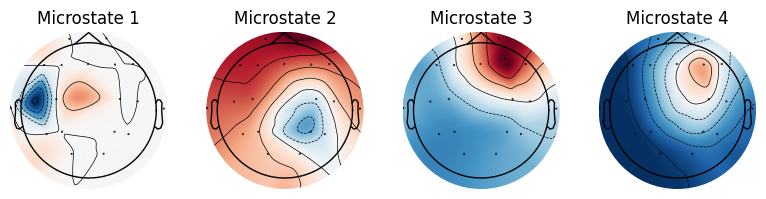

In [10]:
eeg_raw.rename_channels({ch_name: ch_name.replace("EEG ", "").replace("-Ref", "") for ch_name in eeg_raw.info['ch_names']})

eeg_raw.set_montage("standard_1020")
plot_maps(recording.latent_maps, eeg_raw.info, False)


In [61]:
microstate_sequence = np.array(recording.latent_segmentation)
np.save(base_data_path + "/chb01/microstate_sequence_chb01_03.npy",  microstate_sequence)

## Generate Input

### Spike Input

In [11]:
microstate_sequence =  np.array(recording.latent_segmentation) # np.load(base_data_path + "/chb01/microstate_sequence_chb01_03.npy")

In [12]:
spikes = np.zeros((len(microstate_sequence), 4))
spikes[microstate_sequence == 0, 0] = 1
spikes[microstate_sequence == 1, 1] = 1
spikes[microstate_sequence == 2, 2] = 1
spikes[microstate_sequence == 3, 3] = 1

In [47]:
import matplotlib.pyplot as plt
def plot_microstates(eeg_data, microstate_sequence, freq = 256, time_step_offsets = 0):
     color_map = {
        0: '#00FFFF',
        1: '#FF007F',
        2: '#00CC00',
        3: '#6666FF',
     }
     color_sequence = [color_map[m_id] for m_id in microstate_sequence]
     time_steps = eeg_data.shape[0]
     channels = eeg_data.shape[1]
     dt = 1 / freq
     t = np.arange(eeg_data.shape[0]) * dt
     time_duration = time_steps * dt
     plt.figure(figsize=(10, 8))
     for i in range(channels):
        plt.plot(t + time_step_offsets * dt, eeg_data[:, i] + 0.00015 * (i + 2), markersize=2)
        plt.xlabel('Time (s)')
        plt.ylabel('Channels')

        plt.xlim(time_step_offsets * dt, time_step_offsets * dt + time_duration)
        plt.ylim(0.0, 0.002)
     plt.yticks(np.arange(0, 0.00375, 0.0001))
     plt.plot(t + time_step_offsets * dt, eeg_data[:, i] + 0.00015 * (i + 2), markersize=2)
     for index, _t in enumerate(t):
         plt.vlines(x=_t, ymin = 0, ymax = 0.00013, color = color_sequence[index])
         # plt.scatter(t + time_step_offsets * dt, [[0.0001]] * time_steps, c = color_sequence, s=1, marker = 's')


In [20]:
data = eeg_raw.get_data().T


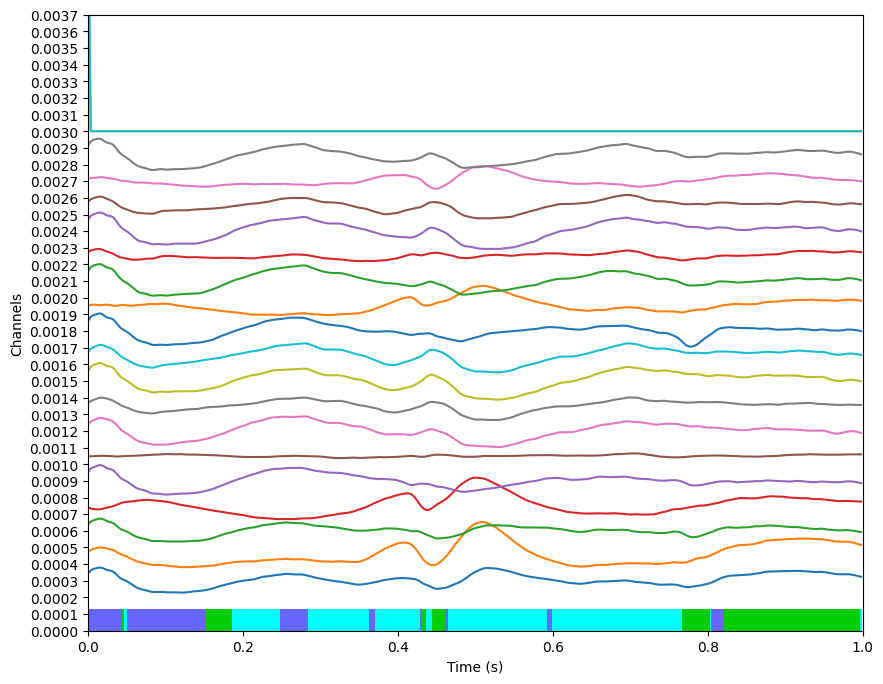

In [81]:
plot_microstates(data[0:500, :], microstate_sequence[0:500], freq=500) 

In [111]:
import matplotlib.pyplot as plt
def plot_spike_trains(spikes, freq = 256.0, time_step_offsets = 0):
     dt = 1 / freq
     time_steps = spikes.shape[0]
     time_duration = time_steps / freq

     n_neurons = spikes.shape[1]
     n_columns = 2
     n_raws = (int)(np.ceil(n_neurons / n_columns))
     time_duration = time_steps / freq
     plt.figure(figsize=(20, 8))
     for neuron_index in range(n_neurons):
        plt.subplot(n_raws, n_columns, neuron_index + 1)
        plt.tight_layout()
        for _t in range(time_steps):
            if spikes[_t, neuron_index] == 1:
                plt.vlines(x=_t / freq, ymin = 0, ymax = 1, color = 'black')
        plt.xlabel('Time (s)')
        plt.ylabel('V_out (mV)')
        plt.title("Input Neuron " + "$" + str(neuron_index + 1) + "$'s spike train")


In [109]:
import matplotlib.pyplot as plt
def plot_raster(spikes, freq = 256.0, time_step_offsets = 0):
     dt = 1 / freq
     time_steps = spikes.shape[0]
     time_duration = time_steps / freq

     t = np.arange(spikes.shape[0]) * dt
     plt.figure(figsize=(20, 8))
     time_duration = spikes.shape[0] / freq
     for i in range(spikes.shape[1]):
        plt.plot(t + time_step_offsets * dt, spikes[:, i] * (i + 1), 'ko', markersize=2)
        plt.xlabel('Time (s)')
        plt.ylabel('Neuron index')
        plt.xlim(time_step_offsets * dt, time_step_offsets * dt + time_duration)
        plt.ylim(0.5, spikes.shape[1]  + 0.5)
     plt.show() 

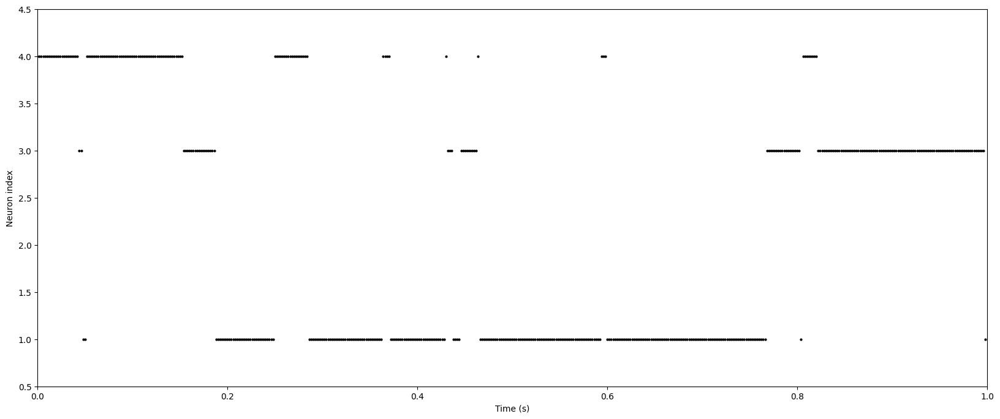

In [85]:
plot_raster(spikes[0:500, ], time_step_offsets = 0, freq = 500)

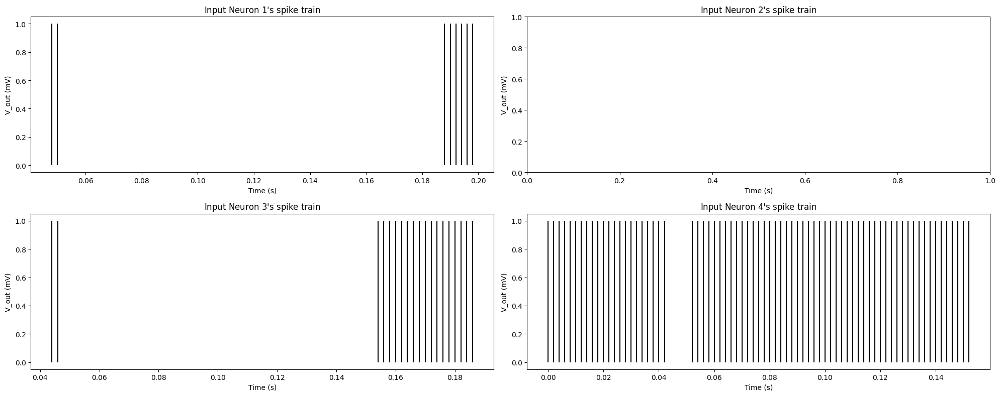

In [112]:
plot_spike_trains(spikes[0:100, ], time_step_offsets = 0, freq = 500)

### Hodgkin-Huxley Model Input

In [16]:
current_input = np.zeros((len(microstate_sequence), 4))
current_input[microstate_sequence == 0, 0] = 10 # uA
current_input[microstate_sequence == 1, 1] = 10
current_input[microstate_sequence == 2, 2] = 10
current_input[microstate_sequence == 3, 3] = 10

In [33]:
import matplotlib.pyplot as plt
def plot_currents(currents, freq = 256.0):
    plt.figure(figsize=(10, 8))


    time_steps = currents.shape[0]
    n_neurons = currents.shape[1]
    
    freq = 256.0
    dt = 1 / freq
    t = np.arange(time_steps) * dt
    n_columns = 2
    n_raws = (int)(np.ceil(n_neurons / n_columns))
    time_duration = time_steps / freq

    for neuron_index in range(n_neurons):
        plt.subplot(n_raws, n_columns, neuron_index + 1)
        plt.tight_layout()

        plt.plot(t, currents[:,neuron_index], color="k")
        plt.xlim(0, time_duration)
        plt.xlabel('$time$ ($s$)')
        plt.ylabel('$I_{inj}$ ($\\mu{A}/cm^2$)')
        plt.title('Neuron $' + str(neuron_index) + '$\'s input current')
    plt.show()

def plot_membrane_voltage(currents, freq = 256.0, time_steps_offset = 0):
    plt.figure(figsize=(10, 8))


    time_steps = currents.shape[0]
    n_neurons = currents.shape[1]
    
    freq = 256.0
    dt = 1 / freq
    t = np.arange(time_steps) * dt
    n_columns = 2
    n_raws = (int)(np.ceil(n_neurons / n_columns))
    time_duration = time_steps / freq

    for neuron_index in range(n_neurons):
        plt.subplot(n_raws, n_columns, neuron_index + 1)
        plt.tight_layout()

        plt.plot(t + time_steps_offset * dt, currents[:,neuron_index], color="k")
        plt.xlim(time_steps_offset * dt, time_duration + time_steps_offset * dt)
        plt.xlabel('$time$ ($s$)')
        plt.ylabel('$V$ ($mV$)')
        plt.title('Neuron $' + str(neuron_index) + '$\'s Membrance Voltage.')
    plt.show()

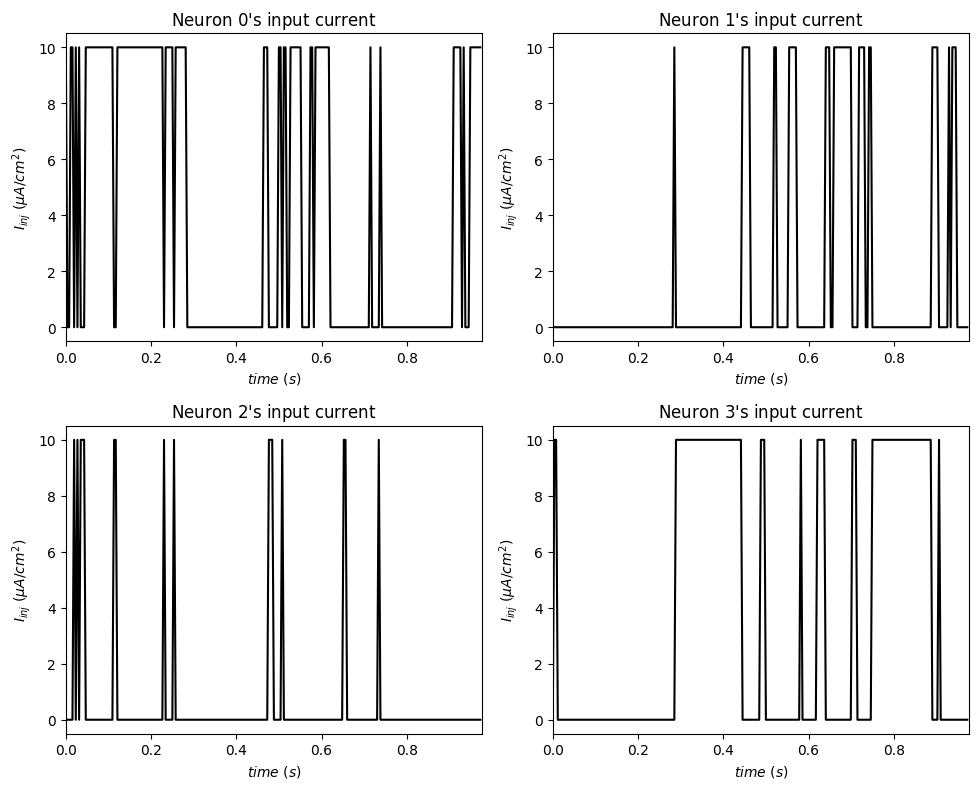

In [18]:
plot_currents(current_input[:250,])

In [19]:
sys.path.append("../")
from snn_lib.neuron_models.hodgkin_huxley_model import *
freq = 256.0
HH_neuron_group = [] 
HH_neuron_group.append(HodgkinHuxleyNeuron({'dt': 1.0 / freq}))
HH_neuron_group.append(HodgkinHuxleyNeuron({'dt': 1.0 / freq}))
HH_neuron_group.append(HodgkinHuxleyNeuron({'dt': 1.0 / freq}))
HH_neuron_group.append(HodgkinHuxleyNeuron({'dt': 1.0 / freq}))


In [20]:
from tqdm import tqdm
time_steps = len(microstate_sequence)
X_arr = np.zeros((time_steps, 4)) # 記録用数组, V,

# simulation nt steps
for i in tqdm(range(time_steps)):
    # in each step, give HH model the stimulas current
    _, X1 = HH_neuron_group[0](current_input[i, 0])
    _, X2 = HH_neuron_group[1](current_input[i, 1])
    _, X3 = HH_neuron_group[2](current_input[i, 2])
    _, X4 = HH_neuron_group[3](current_input[i, 3])

    X_arr[i, 0] = X1
    X_arr[i, 1] = X2
    X_arr[i, 2] = X3
    X_arr[i, 3] = X4

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 921600/921600 [00:51<00:00, 18063.57it/s]


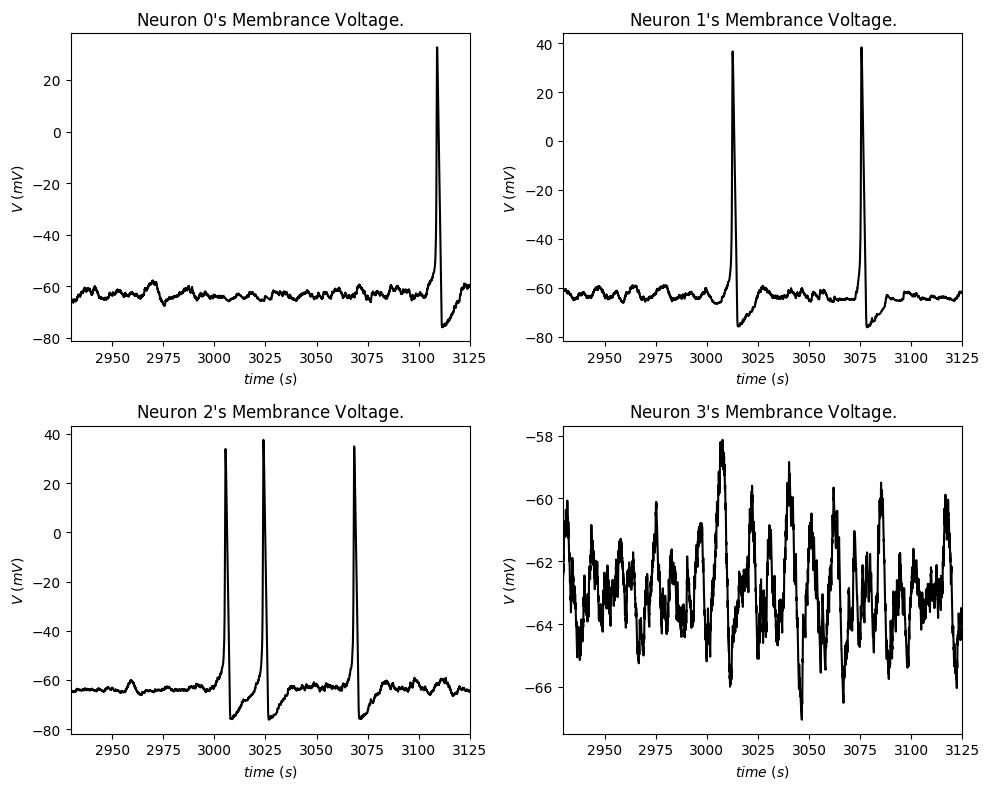

In [71]:
plot_membrane_voltage(X_arr[750000:800000], freq=256.0, time_steps_offset = 750000)
# plot_currents(X_arr[0:900000], freq=256.0)

> It seems seizure correlated to microstate 2 (3, infact) pattern?

In [225]:


dt = 0.01; 
T = 400 # !変更
nt = round(T/dt) 
time = np.arange(0.0, T, dt)

# 生成刺激電流 (uA/cm^2)
I_inj = 10 * (time > 100) - 10 * (time > 200) + 35 * (time > 250) - 35 * (time > 350)

HH_neuron = HodgkinHuxleyNeuron({'dt': dt})
X_arr = np.zeros((nt, 4)) 

# simulation nt steps
for i in tqdm(range(nt)):
    # in each step, give HH model the stimulas current
    _, X = HH_neuron(I_inj[i]) # __call__
    X_arr[i] = X

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 40000/40000 [00:00<00:00, 63185.45it/s]


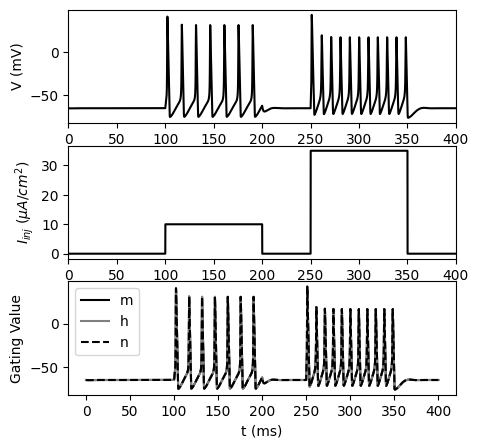

In [226]:
plt.figure(figsize=(5, 5))

# V
plt.subplot(3,1,1)
plt.plot(time, X_arr[:,0], color="k")
plt.ylabel('V (mV)'); 
plt.xlim(0, T)

plt.subplot(3,1,2)
plt.plot(time, I_inj, color="k")
plt.ylabel('$I_{inj}$ ($\\mu{A}/cm^2$)')
plt.xlim(0, T)


# m,h,n
plt.subplot(3,1,3)
plt.plot(time, X_arr[:,1], 'k', label='m')
plt.plot(time, X_arr[:,2], 'gray', label='h')
plt.plot(time, X_arr[:,3], 'k', linestyle="dashed", label='n')
plt.xlabel('t (ms)'); plt.ylabel('Gating Value'); plt.legend(loc="upper left")

plt.show()

In [245]:
times_steps = len(microstate_sequence)
labels = np.zeros((times_steps))
labels[2996 * 256 - 60 * 256: 2996 * 256 + 60 * 256] = 1

In [69]:
from snn_lib.neuron_models.leaky_intergrate_and_fire_model import *
from snn_lib.synapse_models.delay_connection import *
from snn_lib.synapse_models.exponential_synapse import *
from snn_lib.neuron_models.point_process_model import *
from snn_lib.network_archtecture.full_connection import *

In [254]:
class ErrorSignal:
    def __init__(self, N, dt=1e-4, td=1e-2, tr=5e-3):
        self.dt = dt
        self.td = td
        self.tr = tr

        self.N = N
        self.r = np.zeros(N)
        self.hr = np.zeros(N)
        self.b = (td/tr)**(td/(tr-td)) # 規格化定数
    def initialize_states(self):
        self.r = np.zeros(self.N)
        self.hr = np.zeros(self.N)
    def __call__(self, output_spike, target_spike):
        r = self.r*(1-self.dt/self.tr) + self.hr/self.td*self.dt
        hr = self.hr*(1-self.dt/self.td)+(target_spike-output_spike)/self.b
        self.r = r
        self.hr = hr
        return r
class EligibilityTrace:
    def __init__(self, N_in, N_out, dt=1e-4, td=1e-2, tr=5e-3):
        self.dt = dt
        self.td = td
        self.tr = tr
        self.N_in = N_in
        self.N_out = N_out
        self.r = np.zeros((N_out, N_in))
        self.hr = np.zeros((N_out, N_in))

    def initialize_states(self):
        self.r = np.zeros((self.N_out, self.N_in))
        self.hr = np.zeros((self.N_out, self.N_in))

    def surrogate_derivative_fastsigmoid(self, u, beta=1, vthr=-50):
        return 1 / (1 + np.abs(beta*(u-vthr)))**2
    
    def __call__(self, pre_current, post_voltage):
        # (N_out, 1) x (1, N_in) -> (N_out, N_in)
        pre_ = np.expand_dims(pre_current, axis=0)
        post_ = np.expand_dims(self.surrogate_derivative_fastsigmoid(post_voltage),axis=1)
        r = self.r*(1-self.dt/self.tr) + self.hr*self.dt
        hr = self.hr*(1-self.dt/self.td)+np.dot(post_,pre_)/(self.tr*self.td)
        self.r = r
        self.hr = hr
        return r

In [260]:
freq = 256.0
dt = 1 / freq; T = time_steps * dt; nt = time_steps
t_weight_update = 0.5 #重みの更新時間
nt_b = round(t_weight_update/dt) #重みの更新ステップ
num_iter = 200 # 学習のイテレーション数

N_in = 4 # 入力ユニット数
N_mid = 50 # 中間ユニット数
N_out = 1 # 出力ユニット数

input_spikes = spikes
y = labels

# Model Definition
neurons_1 = CurrentBasedLIFNeuron(N_mid, {'dt': dt, 'T': T})
neurons_2 = CurrentBasedLIFNeuron(N_out, {'dt': dt, 'T': T})
delay_conn1 = DelayConnection(N_in, delay = 8e-4)
delay_conn2 = DelayConnection(N_mid, delay = 8e-4)
synapses_1 = DoubleExponentialSynapse(N_in, dt = dt, td = 1e-2, tr = 5e-3)
synapses_2 = DoubleExponentialSynapse(N_mid, dt = dt, td = 1e-2, tr = 5e-3)

es = ErrorSignal(N_out)
et1 = EligibilityTrace(N_in, N_mid)
et2 = EligibilityTrace(N_mid, N_out)
connect_1 = FullConnection(N_in, N_mid,initW=0.1*np.random.rand(N_mid, N_in))
connect_2 = FullConnection(N_mid, N_out,initW=0.1*np.random.rand(N_out, N_mid))
r0 = 1e-3
gamma = 0.7

# 記録用配列
current_arr = np.zeros((N_mid, nt))
voltage_arr = np.zeros((N_out, nt))
error_arr = np.zeros((N_out, nt))
lambda_arr = np.zeros((N_out, N_mid, nt))
dw_arr = np.zeros((N_out, N_mid, nt))
cost_arr = np.zeros(num_iter)

In [261]:
from tqdm import tqdm
iters = tqdm(range(num_iter))
for i in iters:
    if i%15 == 0:
        r0 /= 2 # 重み減衰
        
    # 状態の初期化
    neurons_1.reset_states()
    neurons_2.reset_states()
    synapses_1.initialize_states()
    synapses_2.initialize_states()
    delay_conn1.initialize_states()
    delay_conn2.initialize_states()
    es.initialize_states()
    et1.initialize_states()
    et2.initialize_states()
    
    m1 = np.zeros((N_mid, N_in))
    m2 = np.zeros((N_out, N_mid))
    v1 = np.zeros((N_mid, N_in))
    v2 = np.zeros((N_out, N_mid))
    cost = 0
    count = 0
    
    # one iter.
    for t in range(nt):
        # Feed-forward
        c1 = synapses_1(delay_conn1(input_spikes[t])) # input current
        h1 = connect_1(c1)
        _, s1 = neurons_1(h1) # spike of mid neurons
        c2 = synapses_2(delay_conn2(s1))
        h2 = connect_2(c2)
            
        _, s2 = neurons_2(h2)
        
        # Backward(誤差の伝搬)
        e2 = np.expand_dims(es(s2, y[t]), axis=1) / N_out
        e1 = connect_2.backward(e2) / N_mid
        # e1 = np.dot(B, e2) / N_mid
        # コストの計算
        cost += np.sum(e2**2)
        lambda2 = et2(c2, neurons_2.v_)
        lambda1 = et1(c1, neurons_1.v_)
        g2 = e2 * lambda2
        g1 = e1 * lambda1
        v1 = np.maximum(gamma*v1, g1**2)
        v2 = np.maximum(gamma*v2, g2**2)
        m1 += g1
        m2 += g2
        count += 1
        if count == nt_b:
            # 重みの更新
            lr1 = r0/np.sqrt(v1+1e-8)
            lr2 = r0/np.sqrt(v2+1e-8)
            dW1 = np.clip(lr1*m1*dt, -1e-3, 1e-3)
            dW2 = np.clip(lr2*m2*dt, -1e-3, 1e-3)
            connect_1.W = np.clip(connect_1.W + dW1, -0.1, 0.1)
            connect_2.W = np.clip(connect_2.W + dW2, -0.1, 0.1)

            # reset
            m1 = np.zeros((N_mid, N_in))
            m2 = np.zeros((N_out, N_mid))
            v1 = np.zeros((N_mid, N_in))
            v2 = np.zeros((N_out, N_mid))
            count = 0
        
        # 保存
        if i == num_iter-1:
            current_arr[:, t] = c2
            voltage_arr[:, t] = neurons_2.v_
            error_arr[:, t] = e2
            lambda_arr[:, :, t] = lambda2

    cost_arr[i] = cost
    iters.set_postfix({'cost': cost})

 12%|██████████▌                                                                                 | 23/200 [48:43<6:14:56, 127.10s/it, cost=8.65e+8]


KeyboardInterrupt: 

# Frequency Trainning

In [329]:
import matplotlib.pyplot as plt

In [330]:
# def calculate frequency density
def generate_frequency_density(eeg_data, seizure_onset_annotations, sampling_frequency = 256, \
                               left_decay_coefficiency = 0.4, right_decay_coefficiency = 0.4):
    time_steps = eeg_data.shape[0]
    frequency_density = np.zeros((time_steps))
    for seizure_onset_annotation in seizure_onset_annotations:
        seizure_onset_start_time_step = seizure_onset_annotation[0]
        seizure_onset_end_time_step = seizure_onset_annotation[1]
        frequency_density[seizure_onset_start_time_step: seizure_onset_end_time_step] = sampling_frequency
        time_step = seizure_onset_start_time_step
        while time_step >= 0:
            abs_delta = seizure_onset_start_time_step - time_step
            freq = np.exp(-1 * left_decay_coefficiency * (abs_delta / sampling_frequency)) * sampling_frequency
            frequency_density[time_step] = freq
            time_step -= 1

        time_step = seizure_onset_end_time_step
        while time_step < time_steps:
            abs_delta = time_step - seizure_onset_end_time_step
            freq = np.exp(-1 * right_decay_coefficiency * (abs_delta / sampling_frequency)) * sampling_frequency
            frequency_density[time_step] = freq
            time_step += 1
            
    return frequency_density

def calculate_spike_frequency_distribution_by_sliding_window(spikes_series, windows_size = 256, sampling_frequency = 256):
    time_steps = len(spikes_series)
    frequency_distribution = np.zeros((time_steps))
    cnt_spikes_in_windows = 0
    for t in range(time_steps):
        cnt_spikes_in_windows += spikes_series[t]
        if t < windows_size:
            freq = cnt_spikes_in_windows / windows_size
            frequency_distribution[t] = freq
            continue
        cnt_spikes_in_windows -= spikes_series[t - windows_size]
        freq = cnt_spikes_in_windows / windows_size
        frequency_distribution[t] = freq
        
    return frequency_distribution * sampling_frequency

def plot_frequency_density(frequency_density_data, sampling_frequency = 256):
    time_steps = frequency_density_data.shape[0]
    plt.plot(np.arange(0, time_steps) / sampling_frequency, frequency_density_data)
    plt.xlabel("Time (s)")
    plt.ylabel("Frequency (Hz)")
    plt.title("Temporal Frequency Distribution")


In [331]:
eeg_data_from = 750000
eeg_data_to = 800000
data_length = eeg_data_to - eeg_data_from
experiment_data = data[eeg_data_from: eeg_data_to]
sampling_freq = 256
seizure_onset_annotation = [2996 * sampling_freq - eeg_data_from, 3036 * sampling_freq - eeg_data_from]

target_frequency_density_data = generate_frequency_density(experiment_data, [seizure_onset_annotation])

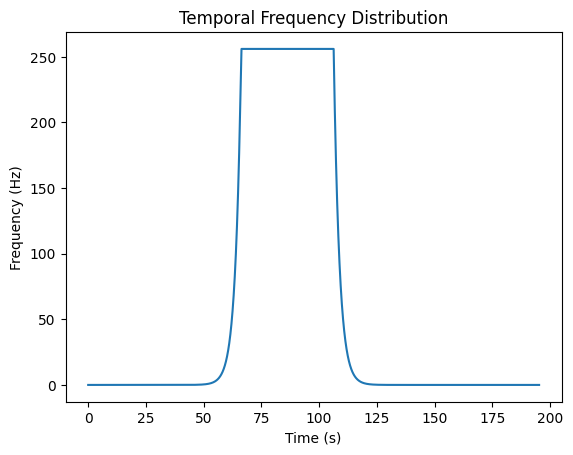

In [332]:
plot_frequency_density(target_frequency_density_data)

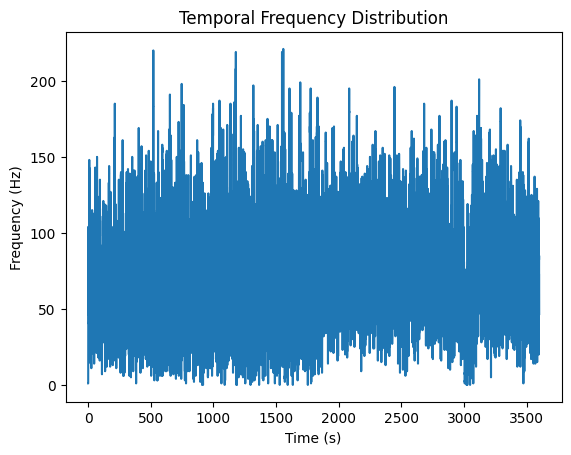

In [333]:
plot_frequency_density(calculate_spike_frequency_distribution_by_sliding_window(spikes[:, 0]))

# Network Building 

## Reservior Computing

In [13]:
from snn_lib.neuron_models.leaky_intergrate_and_fire_model import *
from snn_lib.synapse_models.delay_connection import *
from snn_lib.synapse_models.exponential_synapse import *
from snn_lib.neuron_models.point_process_model import *
from snn_lib.connections.full_connection import *
from snn_lib.connections.one_to_one_connection import OneToOneConnection
from snn_lib.neuron_models.fixed_spike_train_neuron_model import FixedSpikeTrainNeuronModel
from snn_lib.monitors.neuron_monitors import NeuronOutputMonitor, NeuronMembranePotentialMonitor
from snn_lib.monitors.synapse_monitors import *
import numpy as np

In [14]:
neurons = {
}

In [15]:
connections = []

In [16]:
# build reservior
n_reservior_neuron = 39
n_microstates = 4
dt = 1e-4
connection_possibility = 0.2
time_steps = 10001
dummy_spikes = spikes.T #np.random.randint(0, 2, size=(n_microstates, int(time_steps)))

for i in range(n_microstates):
    neuron = FixedSpikeTrainNeuronModel(N = n_microstates, spikes = dummy_spikes[i], hyperparameters = {'dt': dt})
    neuron_id = f'input{i}'
    neurons[neuron_id] = neuron

for i in range(n_reservior_neuron):
    neuron = CurrentBasedLIFNeuron(1, {'dt': dt})
    neuron_id = f'r{i}'
    neurons[neuron_id] = neuron

for i in range(n_reservior_neuron):
    for j in range(n_reservior_neuron):
        if np.random.random() < connection_possibility:
            connections.append((f'r{i}', f'r{j}', OneToOneConnection(), DoubleExponentialSynapse(1, dt = dt, td = 1e-2, tr = 5e-3)))

output_neuron = CurrentBasedLIFNeuron(1, {'dt': dt})
neurons['output'] = output_neuron

for i in range(n_reservior_neuron):
    connections.append((f'r{i}', f'output', OneToOneConnection(), DoubleExponentialSynapse(1, dt = dt, td = 1e-2, tr = 5e-3)))
    connection_id = f'one_to_one_{i}_output'

for i in range(n_microstates):
    connections.append((f'input{i}', f'r{i}', OneToOneConnection(), DoubleExponentialSynapse(1, dt = dt, td = 1e-2, tr = 5e-3)))



In [17]:
#neurons

In [18]:
 # c1 = synapses_1(delay_conn1(input_spikes[t])) # input current
 #        h1 = connect_1(c1)
 #        _, s1 = neurons_1(h1) # spike of mid neurons
 #        c2 = synapses_2(delay_conn2(s1))
 #        h2 = connect_2(c2)
            
 #        _, s2 = neurons_2(h2)

time_steps = 10000
w1 = 1.0
w2 = 1.0
w3 = 1.0
w4 = 1.0


neuron_output_monitor = NeuronOutputMonitor()
neuron_membrane_potential_monitor = NeuronMembranePotentialMonitor()
synapse_output_monitor = SynapseOutputMonitor()

for neuron_id in neurons:
    neuron = neurons[neuron_id]
    neuron.initialize()
    neuron.reset_time()
    neuron_output_monitor.record_neuron_output(0, neuron, neuron_id)
    neuron_membrane_potential_monitor.record_neuron_membrane_potential(0, neuron, neuron_id)

for connection in connections:
    connection[2].initialize()
    connection[3].initialize()
    synapse_id = f's[{connection[0]}_{connection[1]}]'
    synapse_output_monitor.record_synapse_output(0, connection[3], synapse_id)



In [19]:
from tqdm import tqdm


for t in tqdm(range(time_steps)):
    def evolve_neuron(neuron_id):
        # Neuron's states have been already updated at this time step,
        #   but have not been written back to the states property yet.
        # The updated states are stored in `cached_states_and_output` 
        #   property.
        # In this condition, for avoiding reduplicative update, we 
        #   directly retrieve the states.
        neuron = neurons[neuron_id]

        # or, we need update this neuron's state in this .
        # find all synapse target is this neuron
        connections_to_current_neuron = []
        
        for connection in connections:
            if connection[1] == neuron_id:
                connections_to_current_neuron.append(connection)
        total_synapse_out = 0
       
        for connection in connections_to_current_neuron:
            synapse = connection[3]
            synapse_states, synapse_out = synapse.states, synapse.states[synapse._output_index]
            
            total_synapse_out += synapse_out
      
        return neurons[neuron_id](total_synapse_out)
            
    for neuron_id in neurons:
        evolve_neuron(neuron_id)

    for connection in connections:
        conn = connection[2]
        synapse = connection[3]
        pre_neuron = neurons[connection[0]]
        post_neuron = neurons[connection[1]]
        connection_states, connection_output = conn(pre_neuron.states[pre_neuron._output_index])
        synapse_states, synapse_output = synapse(connection_output)
        
    # `step_to_next_states()` will write back the states from  `cached_states` property to
    # `states` property.
    for neuron_id in neurons:
        neuron = neurons[neuron_id]
        neuron.do_update_states()
        neuron_output_monitor.record_neuron_output(t + 1, neuron, neuron_id)
        neuron_membrane_potential_monitor.record_neuron_membrane_potential(t + 1, neuron, neuron_id)
    
    for connection in connections:
        connection[2].do_update_states()
        connection[3].do_update_states()
        synapse_id = f's[{connection[0]}_{connection[1]}]'
        synapse_output_monitor.record_synapse_output(t + 1, connection[3], synapse_id)

    


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [01:40<00:00, 99.68it/s]


In [20]:
neuron_output_record = neuron_output_monitor.get_dataframe_record()

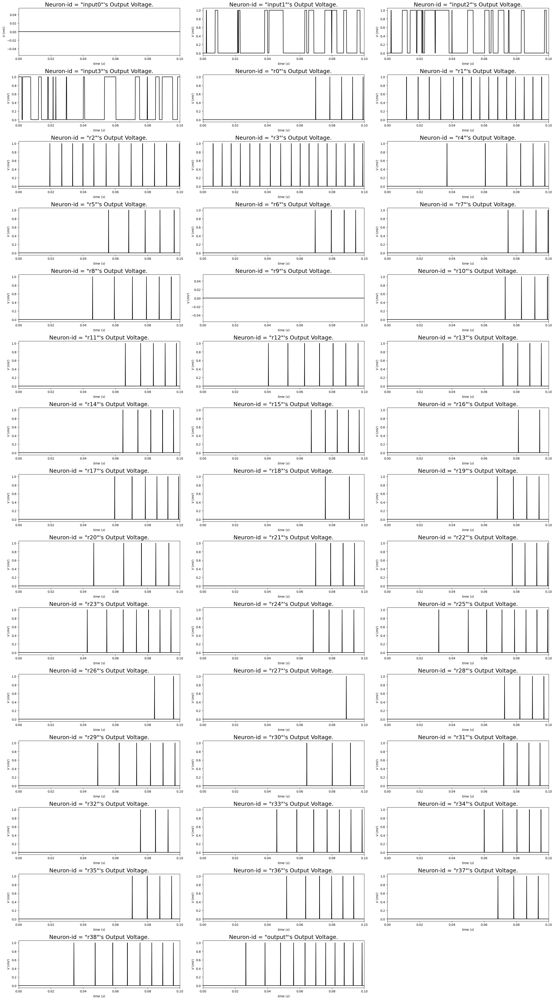

In [21]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(25,45))
rows = int(np.ceil(len(neuron_output_record.columns) / 3))
cols = 3
for i in range(rows):
    for j in range(cols):
        if i * cols + j >= len(neuron_output_record.columns):
            break
        plt.subplot(rows, cols, i * cols + j + 1)
        plt.tight_layout()

        plt.plot(np.arange(int(time_steps))[:1000] * dt,list(neuron_output_record.iloc[:, i * cols + j][1:])[:1000] , color="k")
        plt.xlim(0, 1000 * dt)
        plt.xlabel('$time$ ($s$)')
        plt.ylabel('$V$ ($mV$)')
        plt.title('Neuron-id = "' + neuron_output_record.columns[i * cols + j] + '"\'s Output Voltage.', fontsize = 18)

In [22]:
neuron_membrane_potential = neuron_membrane_potential_monitor.get_dataframe_record()
neuron_membrane_potential

,input0,input1,input2,input3,r0,r1,r2,r3,r4,r5,...,r30,r31,r32,r33,r34,r35,r36,r37,r38,output
0,0,0,0,0,-60.0,-60.0,-60.000000,-60.0,-60.0,-60.000000,...,-60.000000,-60.0,-60.0,-60.0,-60.000000,-60.000000,-60.0,-60.000000,-60.0,-60.0
1,0,0,0,0,-60.0,-60.0,-60.000000,-60.0,-60.0,-60.000000,...,-60.000000,-60.0,-60.0,-60.0,-60.000000,-60.000000,-60.0,-60.000000,-60.0,-60.0
2,0,0,0,0,-60.0,-60.0,-60.000000,-60.0,-60.0,-60.000000,...,-60.000000,-60.0,-60.0,-60.0,-60.000000,-60.000000,-60.0,-60.000000,-60.0,-60.0
3,0,0,0,0,-60.0,-60.0,-60.000000,-60.0,-60.0,-60.000000,...,-60.000000,-60.0,-60.0,-60.0,-60.000000,-60.000000,-60.0,-60.000000,-60.0,-60.0
4,0,0,0,0,-60.0,-60.0,-60.000000,-60.0,-60.0,-60.000000,...,-60.000000,-60.0,-60.0,-60.0,-60.000000,-60.000000,-60.0,-60.000000,-60.0,-60.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9996,0,0,0,0,-60.0,-60.0,-52.913025,-60.0,-60.0,-57.096752,...,-59.681741,-60.0,-60.0,-60.0,-54.133399,-51.950184,-60.0,-52.063495,-60.0,-60.0
9997,0,0,0,0,-60.0,-60.0,-52.512353,-60.0,-60.0,-56.699687,...,-59.366902,-60.0,-60.0,-60.0,-53.515879,-51.367173,-60.0,-51.389188,-60.0,-60.0
9998,0,0,0,0,-60.0,-60.0,-52.116786,-60.0,-60.0,-56.306794,...,-59.055505,-60.0,-60.0,-60.0,-52.905411,-50.789731,-60.0,-50.722944,-60.0,-60.0
9999,0,0,0,0,-60.0,-60.0,-51.726334,-60.0,-60.0,-55.918110,...,-58.746865,-60.0,-60.0,-60.0,-52.302033,-50.217942,-60.0,-50.064794,-60.0,-60.0


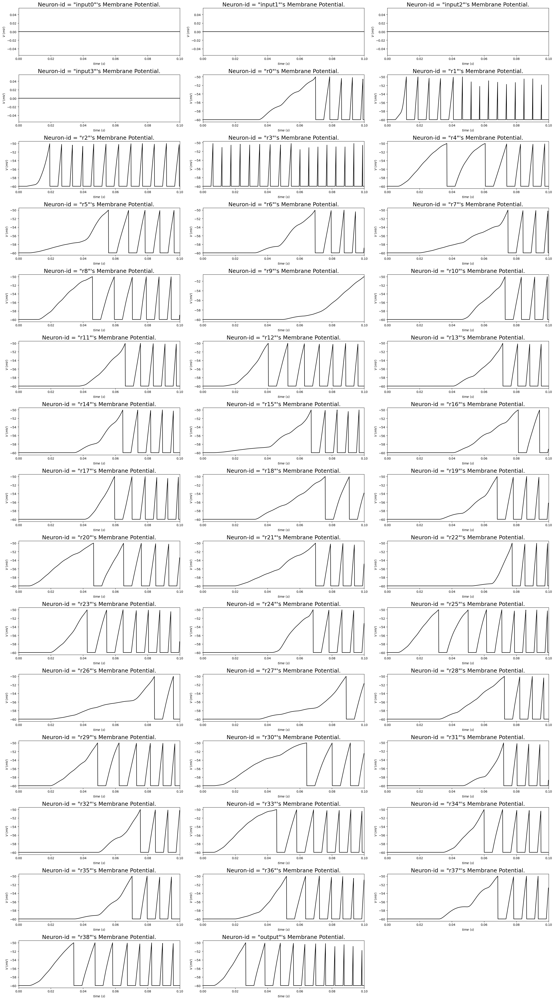

In [23]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(25,45))
rows = int(np.ceil(len(neuron_membrane_potential.columns) / 3))
cols = 3
for i in range(rows):
    for j in range(cols):
        if i * cols + j >= len(neuron_membrane_potential.columns):
            break
        plt.subplot(rows, cols, i * cols + j + 1)
        plt.tight_layout()

        plt.plot(np.arange(int(time_steps))[:1000] * dt,list(neuron_membrane_potential.iloc[:, i * cols + j][1:])[:1000] , color="k")
        plt.xlim(0, 1000 * dt)
        plt.xlabel('$time$ ($s$)')
        plt.ylabel('$V$ ($mV$)')
        plt.title('Neuron-id = "' + neuron_membrane_potential.columns[i * cols + j] + '"\'s Membrane Potential.', fontsize = 18)

In [24]:
synapse_output = synapse_output_monitor.get_dataframe_record()
synapse_output

,s[r0_r0],s[r0_r7],s[r0_r15],s[r0_r17],s[r0_r27],s[r0_r30],s[r0_r35],s[r0_r38],s[r1_r8],s[r1_r12],...,s[r33_output],s[r34_output],s[r35_output],s[r36_output],s[r37_output],s[r38_output],s[input0_r0],s[input1_r1],s[input2_r2],s[input3_r3]
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.101197
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.300555
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.595109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9996,6.134966,4.742516,10.287680,2.134436,8.898477,8.919997,2.682679,12.921577,14.167105,3.599453,...,11.100265,0.085644,9.179169,2.836455,2.471488,13.502334,1.327968e-13,101.556932,17.074875,328.867317
9997,6.160668,4.762384,10.330778,2.143378,8.935755,8.957365,2.693918,12.975709,14.103764,3.583359,...,11.118224,0.085284,9.137254,2.829463,2.460411,13.475992,1.314688e-13,102.204770,16.966277,328.901234
9998,6.184371,4.780707,10.370526,2.151625,8.970135,8.991829,2.704283,13.025633,14.201768,3.608259,...,11.133425,0.084917,9.094760,2.822115,2.449171,13.447740,1.301541e-13,102.932693,16.857522,328.868360
9999,6.206131,4.797528,10.407015,2.159196,9.001697,9.023467,2.713798,13.071465,14.294011,3.631696,...,11.145945,0.084544,9.051714,2.814421,2.437777,13.417640,1.288526e-13,103.738168,16.748636,328.770692


In [26]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(25,450))
rows = int(np.ceil(len(synapse_output.columns) / 3))
cols = 3
for i in range(rows):
    for j in range(cols):
        if i * cols + j >= len(synapse_output.columns):
            break
        plt.subplot(rows, cols, i * cols + j + 1)
        plt.tight_layout()

        plt.plot(np.arange(int(time_steps))[:1000] * dt,list(synapse_output.iloc[:, i * cols + j][1:])[:1000] , color="k")
        plt.xlim(0, 1000 * dt)
        plt.xlabel('$time$ ($s$)')
        plt.ylabel('$Current$ ($uA$)')
        plt.title('Neuron-id = "' + synapse_output.columns[i * cols + j] + '"\'s Synapse Output Current.', fontsize = 18)

In [8]:
from graphviz import Digraph 

def plot_model_graph(neurons, connections, graph_name="undefine"):
          
    # instantiating object 
    dot = Digraph(comment=graph_name, edge_attr={'weight':'1',
                     'fontsize':'18',
                     'fontcolor':'blue',
                     'len':'4'},
          graph_attr={'fixedsize':'false', 
                      'bgcolor':'transparent', 'overlap':'false', 'pad':"1,0.25"},
          node_attr={'fontsize':'18', 
                     'color':'black',
                     'fontcolor':'black'}) 
      
    # Adding nodes 
    for neuron_key in neurons:
        dot.node(neuron_key, color='blue')
      
    # # Adding edges 
    for connection in connections:
        dot.edge(connection[0], connection[1], color = 'blue')
    # dot.edges(['AB', 'AC', 'AD']) 
    # dot.edge('B', 'C', constraint = 'false') 
    # dot.edge('C', 'D', constraint = 'false') 
    return dot
      
    

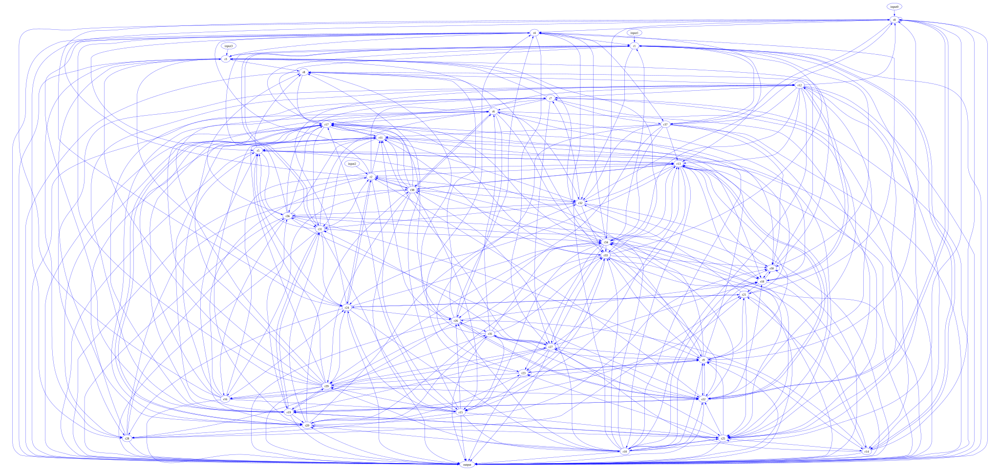

In [9]:
import pydotplus

dot = plot_model_graph(neurons, connections)
dot.attr(layout="dot")
dot.attr(size='500,500')
(dot)

In [310]:
print(dot)

// undefine
digraph {
	graph [bgcolor=transparent fixedsize=false overlap=false pad="1,0.25"]
	node [color=black fontcolor=black fontsize=18]
	edge [fontcolor=blue fontsize=18 len=4 weight=1]
	r0 [color=blue]
	r1 [color=blue]
	r2 [color=blue]
	r3 [color=blue]
	r4 [color=blue]
	r5 [color=blue]
	r6 [color=blue]
	r7 [color=blue]
	r8 [color=blue]
	r9 [color=blue]
	r10 [color=blue]
	r11 [color=blue]
	r12 [color=blue]
	r13 [color=blue]
	r14 [color=blue]
	r15 [color=blue]
	r16 [color=blue]
	r17 [color=blue]
	r18 [color=blue]
	r19 [color=blue]
	r20 [color=blue]
	r21 [color=blue]
	r22 [color=blue]
	r23 [color=blue]
	r24 [color=blue]
	r25 [color=blue]
	r26 [color=blue]
	r27 [color=blue]
	r28 [color=blue]
	r29 [color=blue]
	r30 [color=blue]
	r31 [color=blue]
	r32 [color=blue]
	r33 [color=blue]
	r34 [color=blue]
	r35 [color=blue]
	r36 [color=blue]
	r37 [color=blue]
	r38 [color=blue]
	r0 -> r9 [color=blue]
	r0 -> r13 [color=blue]
	r0 -> r15 [color=blue]
	r0 -> r23 [color=blue]
	r0 -> r27 [color=blu

In [311]:

# # saving source code 
# dot.format = 'png'
# dot.render('Graph', view = True)  

'Graph.png'